In [47]:
import numpy as np
import scipy as sp
from scipy import io
import cv2 as cv 
import matplotlib.pyplot as plt
import pylab
import os # for reading all files in a folder
pylab.rcParams['figure.figsize'] = (3.0, 2.0)

# Condensation 7c

You'll have to call the code below four times (once each with 'll','lr', 'ul', 'ur': lower left, lower right, upper left, ipper right). For each time you'll get an estimated track (2D locations over time) of one of the corners of the pattern moved. Note that we're saving off the single MAP estimate at each frame, but the particles in the Particle Filter are attempting to keep track of the whole posterior distribution. 

Most TO DO parts below should be copy-paste from Practical9a and Practical9b.

computeLikelihood has been modified from its previous versions to cope with these particular gray-scale images.


Qustions you could ask yourself (not a TO DO): 
- Can you find a pattern between the movement of the particles and the movement of the camera relative to the scene?
- When is the MAP estimate especially good/bad?
- What is the relationship to the amount of noise? (--> experiment with different levels!)
- Why do different numbers of particles lead to very differenet results (for example 50 vs. 2000)? 

In [48]:
#Likelihood function is simple patch similarity

def computeLikelihood(image, template):
    #opencv's available methods - experiment with these
    #careful what range the output is!
    methods = [cv.TM_CCOEFF, cv.TM_CCOEFF_NORMED, cv.TM_CCORR,
            cv.TM_CCORR_NORMED, cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]
    
    likelihood = cv.matchTemplate(image[:,:,2], template, methods[0])
    # (You can also try converting the image to greyscale instead of using the third channel as above with 
    #cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    
    #we can pad to make this the size of the input image (for easier indexing)   
    pad_first = int(template.shape[0])
    pad_second = int(template.shape[1])
    pad_amounts = ((0, pad_first-1), (0, pad_second-1))
    likelihood = np.pad(likelihood, pad_amounts, 'constant')
    likelihood[likelihood<0] = 0 # to avoid negative weights 
    
    # apply a 10x10 averaging filter for stability. You can experiment with different sizes. 
    kernel = np.ones((10,10),np.float32)/100
    smoothed = cv.filter2D(likelihood,-1,kernel) 
    return smoothed 

I have chosen 2 as a number of dimensions here as a corner of a square in a 2D space can be described by x and y coordinates. If we were tracking multiple corners in a different dimension we would have number of corners * number of coordinates in space instead. 

In [49]:

def HW2_Practical7c(corner):
    template = sp.io.loadmat(corner+'.mat')['pixelsTemplate']
    #let's show the template
    print('We are matching this template with shape: ', template.shape)
    plt.imshow(template)
    plt.show()

    # Load all images in folder
    images = []
    iFrame = 0
    folder = 'Pattern01/'
    lst = os.listdir(folder)
    lst.sort()

    for frameNum in lst:
        images.append(cv.imread(folder+frameNum))
        iFrame += 1
    # plot first image 
    plt.imshow(images[0])
    plt.show()

    imgHeight, imgWidth, colors = images[0].shape
    numParticles = 2000;
    weight_of_samples = np.ones((numParticles,1))

    # TO DO: normalize the weights (may be trivial this time) [done]
    weight_of_samples = weight_of_samples / np.sum(weight_of_samples)

    # Initialize which samples from "last time" we want to propagate: all of
    # them!:
    samples_to_propagate = range(0, numParticles)


    # ============================
    # NOT A TODO: You don't need to change the code below, but eventually you may
    # want to vary the number of Dims (compare for example to lab 9b) 
    
    numDims_w = 2;
    # Here we randomly initialize some particles throughout the space of w:
    particles_old = np.random.rand(numParticles, numDims_w)
    particles_old[:,0] = particles_old[:,0] * imgHeight
    particles_old[:,1] = particles_old[:,1] * imgWidth
    # ============================

    #Initialize a temporary array r to store the per-frame MAP estimate of w. This is what we'll return in the end.
    r = np.zeros((iFrame, numDims_w));

    for iTime in range(iFrame):
        print('Processing Frame', iTime)
        # TO DO: compute the cumulative sume of the weights. [done]
        cum_hist_of_weights = np.cumsum(weight_of_samples)


        # ==============================================================
        # Resample the old distribution at time t-1, and select samples, favoring
        # those that had a higher posterior probability.
        # ==============================================================
        samples_to_propagate = np.zeros(numParticles, dtype=np.int32)

        # Pick random thresholds in the cumulative probability's range [0,1]:
        some_threshes = np.random.rand(numParticles)


        # For each random threshold, find which sample in the ordered set is
        # the first one to push the cumulative probability above that
        # threshold, e.g. if the cumulative histogram goes from 0.23 to 0.26
        # between the 17th and 18th samples in the old distribution, and the
        # threshold is 0.234, then we'll want to propagate the 18th sample's w
        # (i.e. particle #18).

        # for sampNum in range(numParticles): 
        #     thresh = some_threshes[sampNum]
        #     for index in range (numParticles):
        #         if cum_hist_of_weights[index] > thresh:
        #             break
        #     samples_to_propagate[sampNum] = index
            
        samples_to_propagate = (cum_hist_of_weights[None, :] > some_threshes[:, None]).argmax(axis=1)

        # Note: it's ok if some of the old particles get picked repeatedly, while
        # others don't get picked at all.


        # =================================================
        # Visualize if you want
        # =================================================
        # plt.title('Cumulative histogram of probabilities for sorted list of particles')
        # plt.plot(np.zeros(numParticles), some_threshes,'b.')
        # plt.plot(range(0, numParticles), cum_hist_of_weights, 'rx-')
        # which_sample_ids = np.unique(samples_to_propagate)
        # how_many_of_each = np.bincount(np.ravel(samples_to_propagate))
        # for k in range(len(which_sample_ids)):
        #    plt.plot(which_sample_ids[k], 0, 'bo-', markersize = 3 * how_many_of_each[k], markerfacecolor='white')
        # plt.xlabel('Indeces of all available samples, with larger blue circles for frequently re-sampled particles\n(Iteration %01d)' % iTime)
        # plt.ylabel('Cumulative probability');
        # plt.show()
        # =================================================
        # =================================================

        # Predict where the particles we sampled from the old distribution of 
        # state-space will go in the next time-step. This means we have to apply 
        # the motion model to each old sample.
        particles_new = np.zeros_like(particles_old)
        for particleNum in range(numParticles):
            # TO DO: Incorporate some noise, e.g. Gaussian noise with std 20,
            #noise_x = np.random.normal(0, 20, particles_old[particleNum, :].shape)
            noise = np.random.normal(0, 20, particles_old[particleNum, :].shape)
            #noise_y = np.random.normal(0, 20, particles_old[particleNum, :].shape)
            # into the current location (particles_old), to give a Brownian
            # motion model.

            particles_new[particleNum, :] =  particles_old[samples_to_propagate[particleNum], :] + noise

            #particles_new[particleNum, :] = particles_old[samples_to_propagate[particleNum]] + np.random.normal(0, 10, particles_old[particleNum, :].shape)

            
            
        # TO DO: Not initially, but change the motion model above to have
        # different degrees of freedom, and optionally completely different
        # motion models. See Extra Credit for more instructions.
        

        #calculate likelihood function
        likelihood = computeLikelihood(images[iTime], template)

        #plot results
        f, axarr = plt.subplots(1, 2)
        axarr[0].imshow(images[iTime])
        axarr[0].set_title('Particles')
        # now draw the particles onto the image
        axarr[0].plot(particles_new[:,1]+template.shape[1]/2, particles_new[:,0]+template.shape[0]/2, 'rx')

        #plot the likelihood
        axarr[1].imshow(likelihood)
        axarr[1].set_title('Likelihood')


        # From here we incorporate the data for the new state (time t):
        # The new particles accompanying predicted locations in state-space
        # for time t, are missing their weights: how well does each particle
        # explain the observations x_t?
        
        # TODO: non vectorized code 
        # for particleNum in range(numParticles):

        #     # Convert the particle from state-space w to measurement-space x:
        #     # Note: that step is trivial here since both are in 2D space of image
        #     # coordinates

        #     # Within the loop, we evaluate the likelihood of each particle:
        #     particle = particles_new[particleNum, :]
        #     # Check that the predicted location is a place we can really evaluate
        #     # the likelihood.
        #     inFrame = particle[0] >= 0.0 and  particle[0] <= imgHeight and particle[1] >= 0.0 and particle[1] <= imgWidth
        #     if inFrame:
        #         minX = particle[1]
        #         minY = particle[0]

        #         weight_of_samples[particleNum] = likelihood[int(minY), int(minX)]

        #     else:
        #         weight_of_samples[particleNum] = 0.0
        
        # Evaluate the likelihood of each particle:
        particles = particles_new[:, :]

        # Check that the predicted locations are places we can really evaluate
        # the likelihood.
        inFrame = np.logical_and.reduce((particles[:, 0] >= 0.0, particles[:, 0] <= imgHeight, particles[:, 1] >= 0.0, particles[:, 1] <= imgWidth))

        # For particles in frame, calculate weights based on likelihood
        minY = particles[inFrame, 0].astype(int)
        minX = particles[inFrame, 1].astype(int)
        weight_of_samples[inFrame] = likelihood[minY, minX][:, None]

        # For particles out of frame, set weights to 0
        weight_of_samples[~inFrame, 0] = 0.0

        # TO DO: normalize the weights [done]
        weight_of_samples = weight_of_samples / np.sum(weight_of_samples)
        
        # find the location of the particle with highest weight
        indices = np.argsort(weight_of_samples,0)
        bestScoringParticles = particles_new[np.squeeze(indices[-15:]), :]

        plt.plot(bestScoringParticles[-1:,1], bestScoringParticles[-1:,0], 'rx')
        # Return the MAP of middle position. Add template.shape/2 because matchTemplate finds the position of the upper left corner 
        # of the template. We want to plot the centre of the template. 
        print(bestScoringParticles[:,1].shape)
        #r[iTime,:] = [bestScoringParticles[-1,1]+template.shape[1]/2, bestScoringParticles[-1,0]+template.shape[0]/2, bestScoringParticles[-1,2] + template.shape[0]/2, bestScoringParticles[-1,3] + template.shape[1]/2 ]
        #plt.plot(bestScoringParticles[:,1]+template.shape[1]/2, bestScoringParticles[:,0]+template.shape[0]/2, 'bx')
        r[iTime,:] = bestScoringParticles[-1,1]+template.shape[1]/2, bestScoringParticles[-1,0]+template.shape[0]/2,

        print(r[iTime,:])   
        plt.show()

        #print the original image and the position of the tracked corner.
        plt.imshow(images[iTime])
        plt.plot(r[iTime,0],r[iTime,1],'rx')
        plt.show()
        # Now we're done updating the state for time t. 
        # For Condensation, just clean up and prepare for the next round of 
        # predictions and measurements:
        particles_old = particles_new

    return r

We are matching this template with shape:  (29, 29)


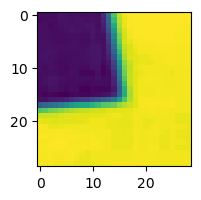

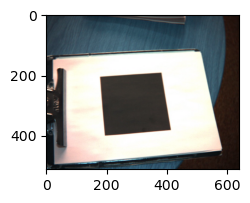

Processing Frame 0
(15,)
[411.48674911 375.37680367]


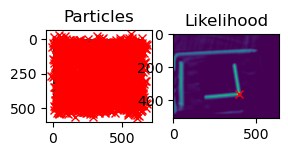

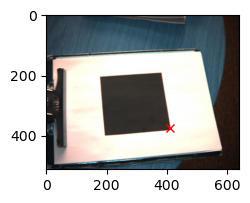

Processing Frame 1
(15,)
[411.72224312 381.21711066]


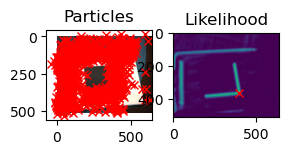

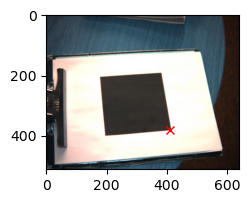

Processing Frame 2
(15,)
[413.44510479 384.50538071]


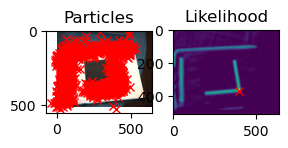

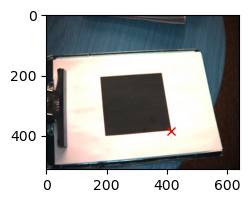

Processing Frame 3
(15,)
[416.96808109 381.2912355 ]


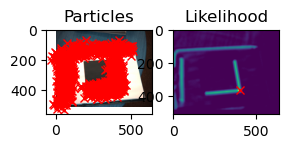

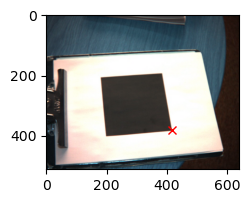

Processing Frame 4
(15,)
[417.09648029 383.70923524]


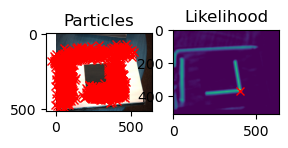

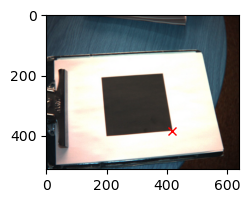

Processing Frame 5
(15,)
[416.60721559 381.85621571]


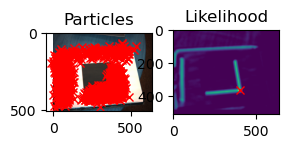

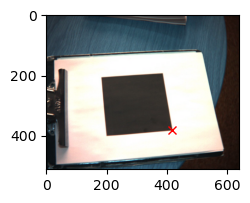

Processing Frame 6
(15,)
[418.29173803 378.66917947]


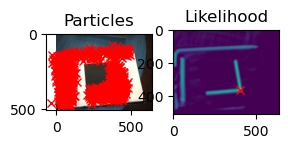

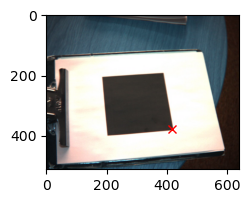

Processing Frame 7
(15,)
[421.53597574 380.171261  ]


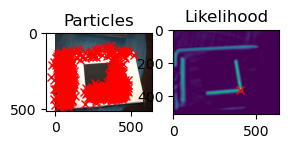

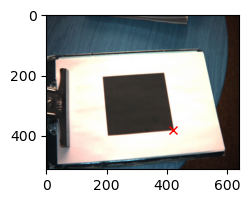

Processing Frame 8
(15,)
[422.3437029  380.66373686]


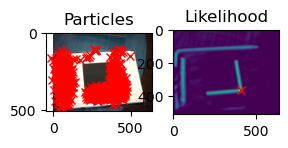

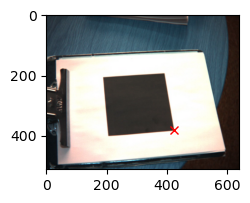

Processing Frame 9
(15,)
[423.73386353 385.17790459]


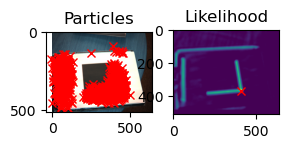

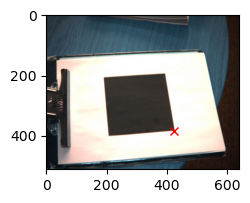

Processing Frame 10
(15,)
[423.43307643 382.28552417]


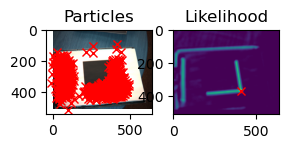

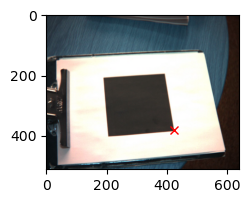

Processing Frame 11
(15,)
[421.52748631 382.83147767]


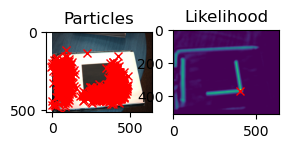

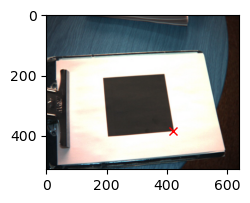

Processing Frame 12
(15,)
[422.05193824 381.66453352]


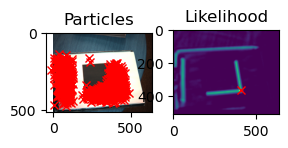

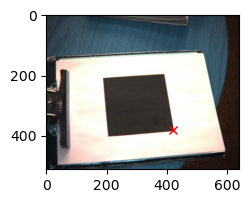

Processing Frame 13
(15,)
[424.68246717 376.81774127]


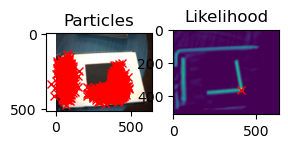

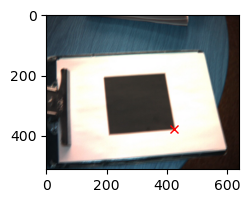

Processing Frame 14
(15,)
[430.71458556 371.57674002]


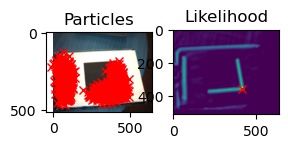

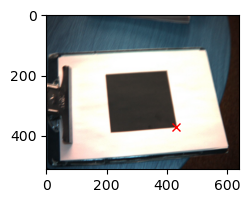

Processing Frame 15
(15,)
[436.82046815 365.74316738]


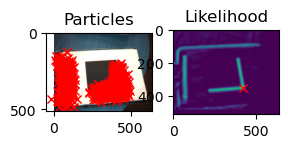

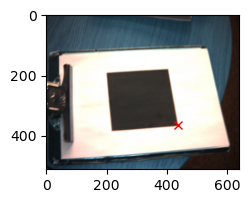

Processing Frame 16
(15,)
[440.75861179 365.98706764]


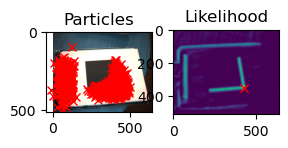

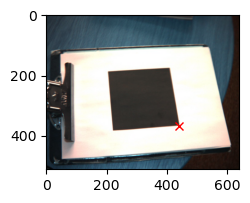

Processing Frame 17
(15,)
[441.72111809 367.1651125 ]


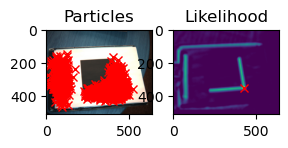

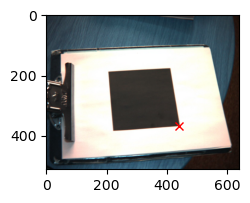

Processing Frame 18
(15,)
[446.91518682 365.51145339]


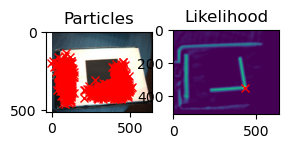

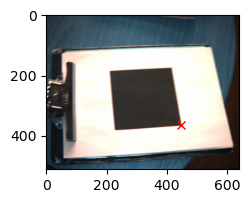

Processing Frame 19
(15,)
[449.84783561 369.08158706]


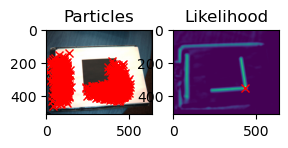

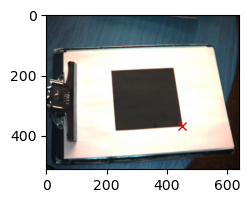

Processing Frame 20
(15,)
[451.57719938 373.72197638]


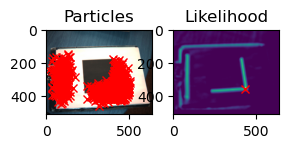

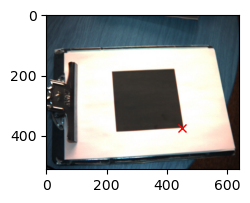

Processing Frame 21
(15,)
[457.01596876 377.35647774]


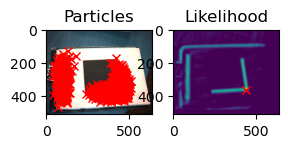

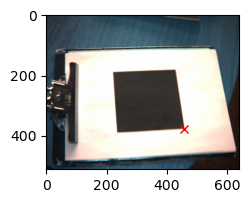

Processing Frame 22
(15,)
[462.31575288 380.46640322]


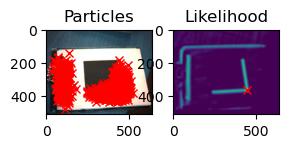

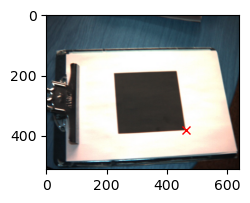

Processing Frame 23
(15,)
[465.67525699 380.61221936]


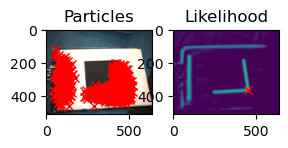

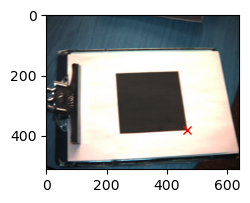

Processing Frame 24
(15,)
[471.10502216 381.61688098]


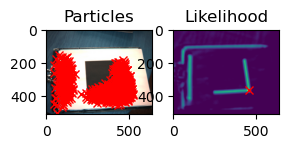

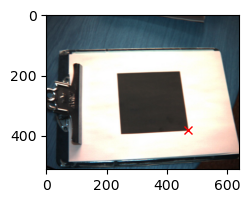

Processing Frame 25
(15,)
[474.87647167 384.0191241 ]


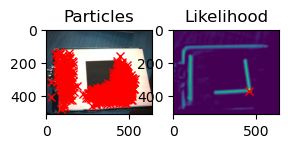

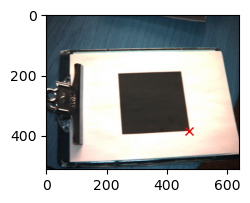

Processing Frame 26
(15,)
[481.19208423 382.0041947 ]


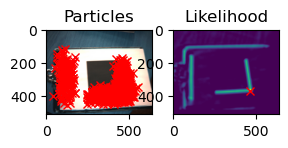

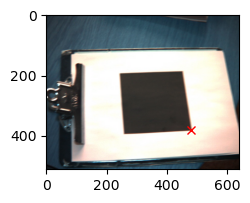

Processing Frame 27
(15,)
[489.63595663 379.95674489]


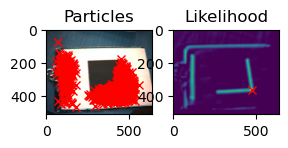

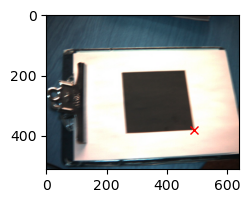

Processing Frame 28
(15,)
[498.46928545 380.10347424]


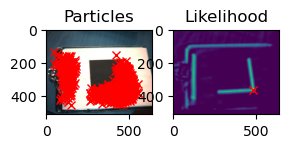

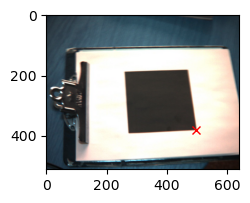

Processing Frame 29
(15,)
[499.54461346 383.29430055]


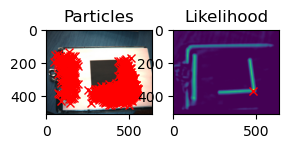

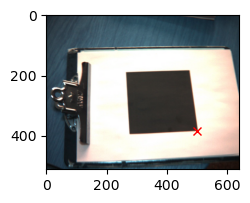

Processing Frame 30
(15,)
[503.4269247 388.5373178]


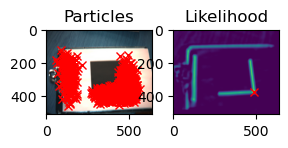

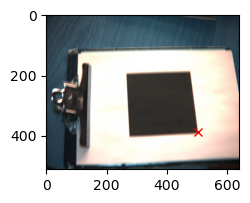

Processing Frame 31
(15,)
[501.00377875 402.45626871]


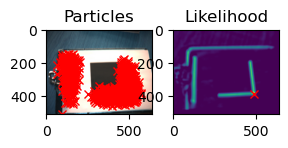

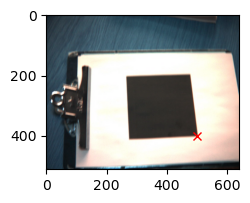

Processing Frame 32
(15,)
[501.00568372 406.41088561]


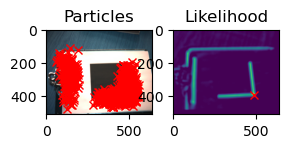

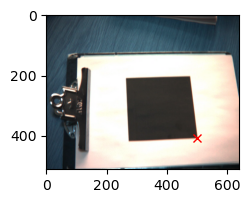

Processing Frame 33
(15,)
[501.31389921 415.05001355]


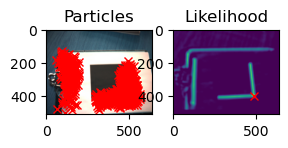

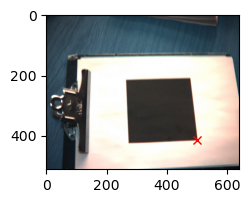

Processing Frame 34
(15,)
[498.04134825 418.83607201]


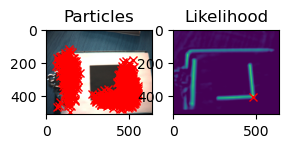

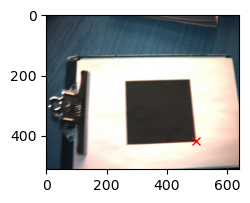

Processing Frame 35
(15,)
[487.0526117  419.84530395]


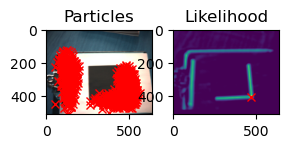

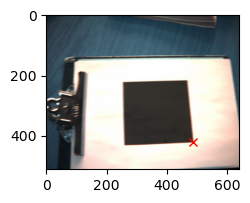

Processing Frame 36
(15,)
[477.79196248 416.46249622]


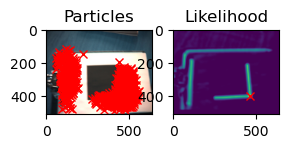

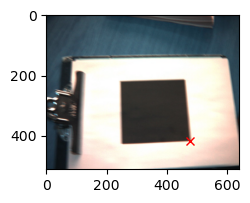

Processing Frame 37
(15,)
[462.96507495 413.45803625]


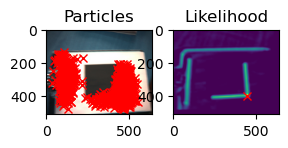

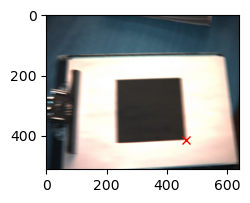

Processing Frame 38
(15,)
[444.09105333 411.17737901]


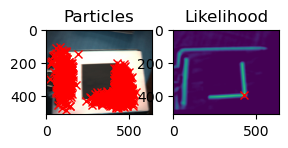

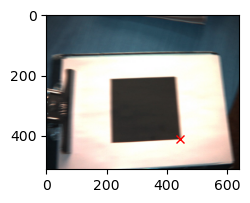

Processing Frame 39
(15,)
[428.5200074  415.99337895]


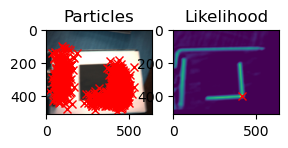

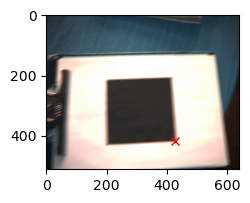

Processing Frame 40
(15,)
[416.45189443 426.63200409]


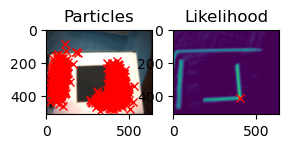

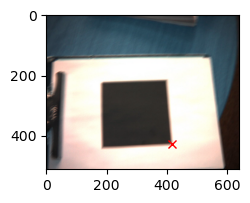

Processing Frame 41
(15,)
[408.78217819 436.83317084]


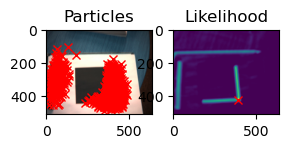

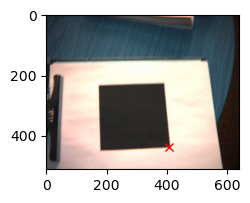

Processing Frame 42
(15,)
[402.55554808 446.35904478]


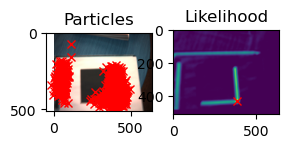

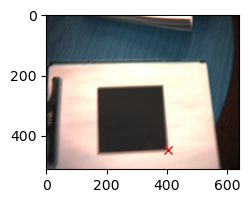

Processing Frame 43
(15,)
[393.09492995 461.68854259]


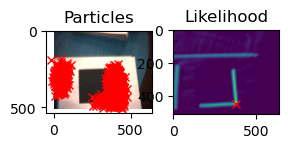

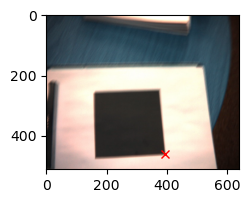

Processing Frame 44
(15,)
[391.96569855 469.0295131 ]


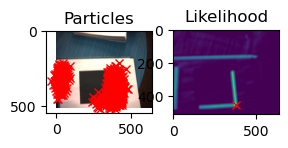

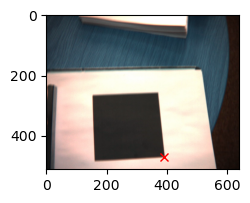

Processing Frame 45
(15,)
[393.36185916 478.16339406]


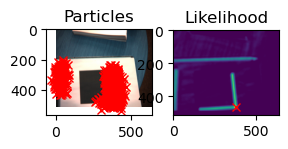

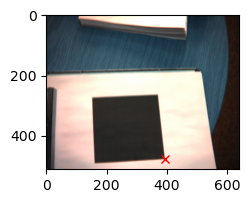

Processing Frame 46
(15,)
[394.73926348 475.48740855]


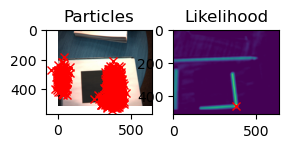

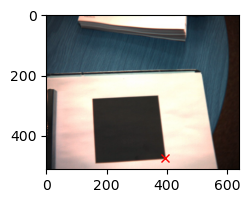

Processing Frame 47
(15,)
[399.10699884 471.83977527]


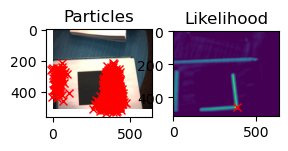

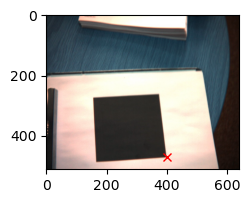

Processing Frame 48
(15,)
[396.85001841 462.514968  ]


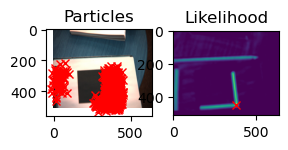

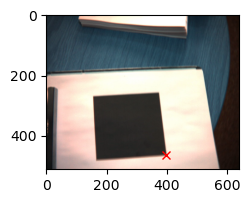

Processing Frame 49
(15,)
[399.67608902 454.35986623]


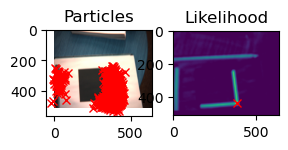

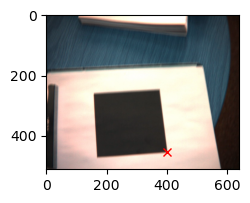

Processing Frame 50
(15,)
[403.46710261 444.55405588]


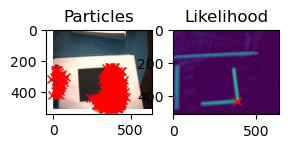

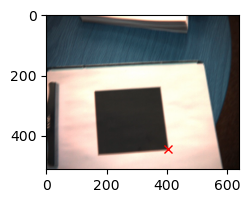

Processing Frame 51
(15,)
[408.44599666 437.70478635]


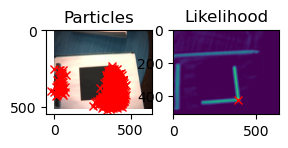

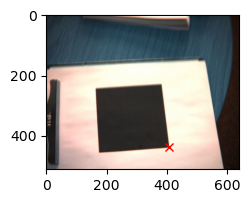

Processing Frame 52
(15,)
[404.70158113 441.72997029]


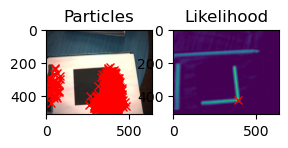

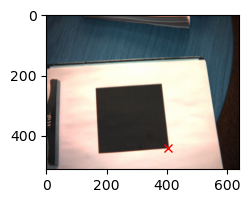

Processing Frame 53
(15,)
[405.85884693 444.32407048]


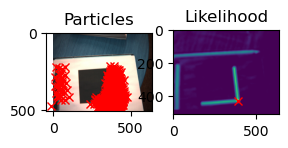

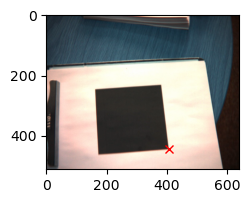

Processing Frame 54
(15,)
[403.46212963 448.78584335]


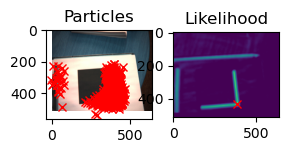

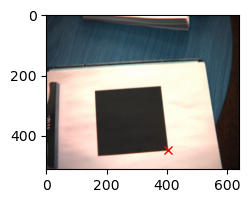

Processing Frame 55
(15,)
[400.30527237 448.53265006]


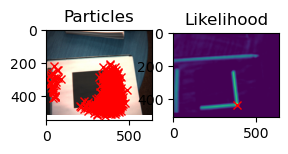

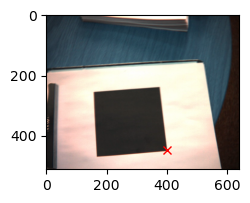

Processing Frame 56
(15,)
[401.46027501 445.35119635]


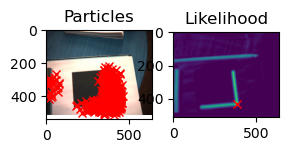

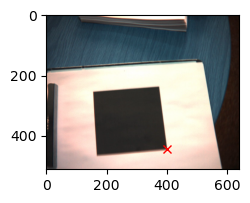

Processing Frame 57
(15,)
[400.93594922 432.95337367]


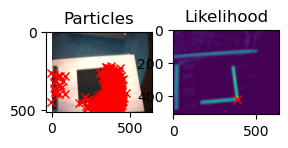

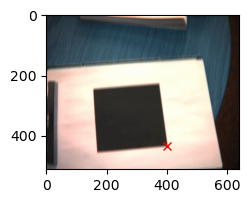

Processing Frame 58
(15,)
[401.3105454 422.859149 ]


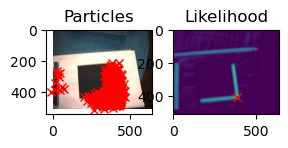

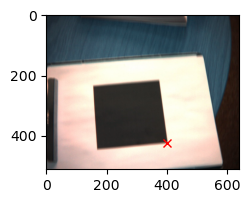

Processing Frame 59
(15,)
[402.98121795 406.4519323 ]


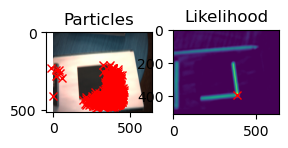

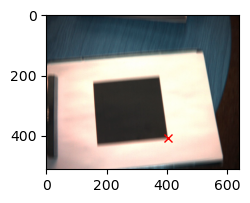

Processing Frame 60
(15,)
[400.90827988 395.44347715]


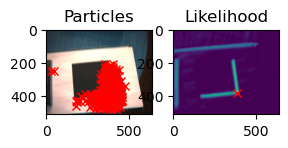

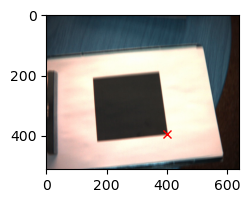

Processing Frame 61
(15,)
[401.22188685 388.7151932 ]


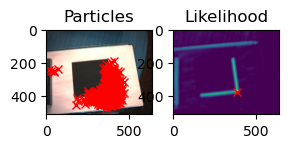

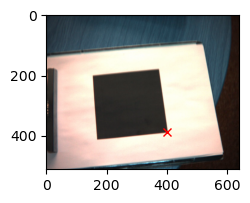

Processing Frame 62
(15,)
[400.83935641 383.84708659]


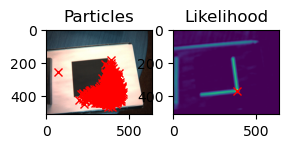

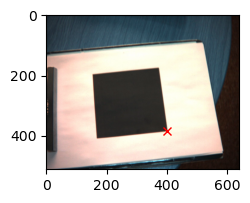

Processing Frame 63
(15,)
[400.91883217 381.57978191]


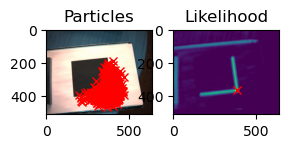

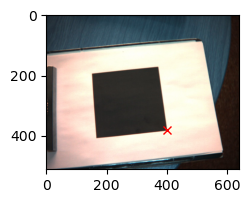

Processing Frame 64
(15,)
[399.50422969 379.51705056]


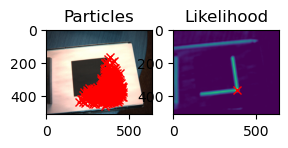

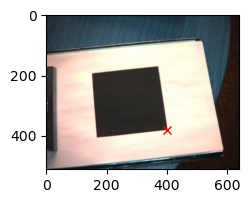

Processing Frame 65
(15,)
[400.07471348 377.64749692]


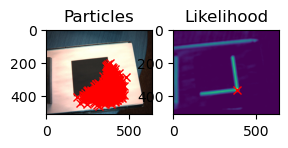

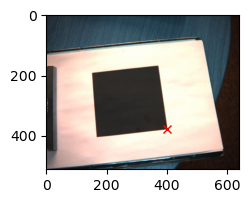

Processing Frame 66
(15,)
[396.80503275 376.79440994]


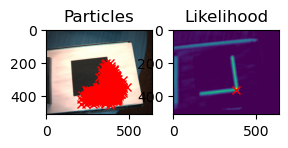

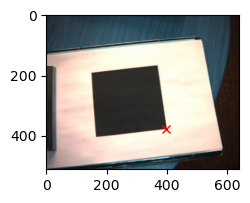

Processing Frame 67
(15,)
[397.59199895 373.14409041]


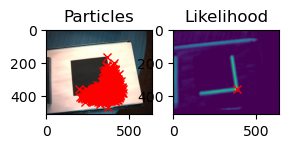

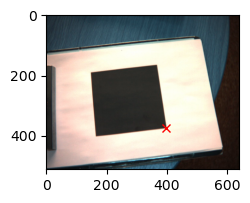

Processing Frame 68
(15,)
[398.04733561 372.53428848]


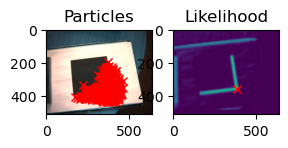

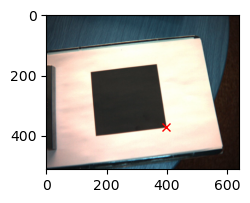

Processing Frame 69
(15,)
[396.94016384 368.95796523]


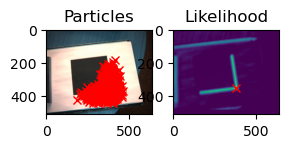

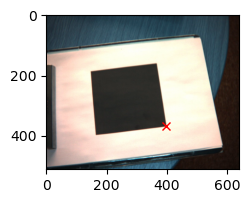

Processing Frame 70
(15,)
[395.96103594 367.59716531]


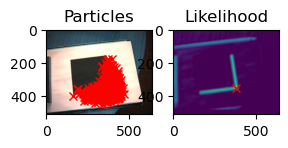

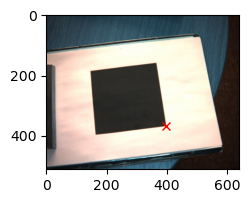

Processing Frame 71
(15,)
[395.655077   366.30500436]


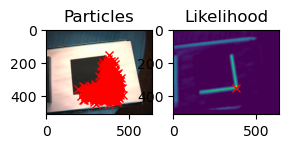

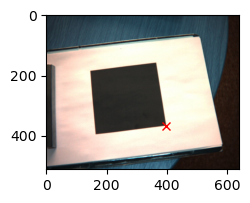

Processing Frame 72
(15,)
[398.12489798 362.9756134 ]


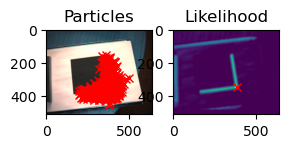

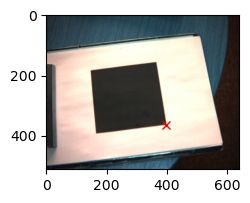

Processing Frame 73
(15,)
[398.94780949 362.37877824]


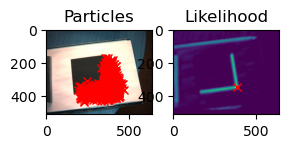

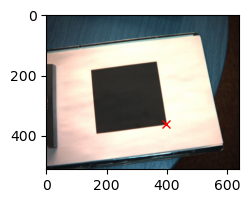

Processing Frame 74
(15,)
[400.27049434 364.19631804]


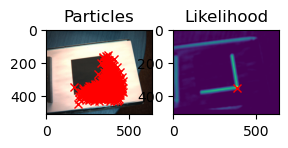

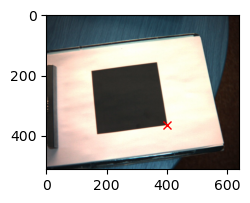

Processing Frame 75
(15,)
[401.77266196 368.25281502]


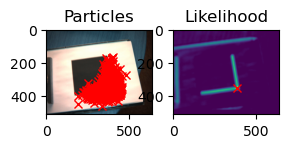

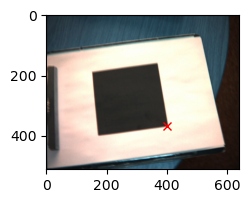

Processing Frame 76
(15,)
[410.44801654 370.37174702]


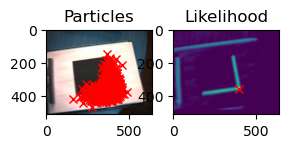

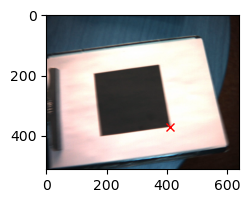

Processing Frame 77
(15,)
[425.00906592 362.42935607]


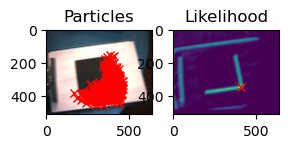

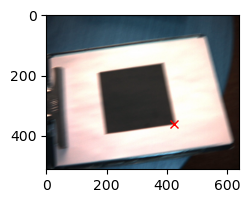

Processing Frame 78
(15,)
[437.64952126 352.82145251]


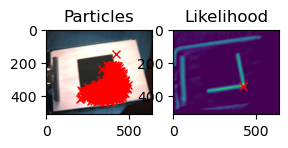

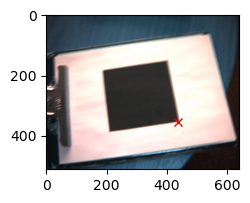

Processing Frame 79
(15,)
[442.5260566 346.3997745]


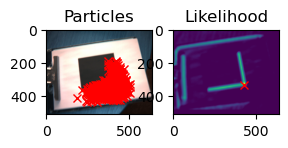

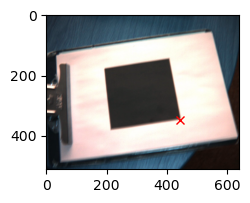

Processing Frame 80
(15,)
[450.51036607 332.05999066]


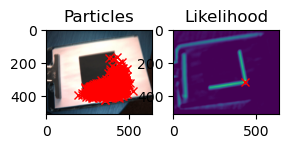

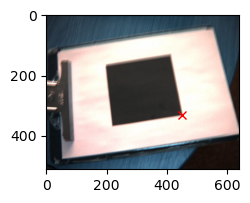

Processing Frame 81
(15,)
[452.29866142 326.35679802]


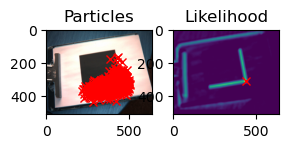

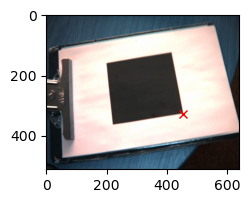

Processing Frame 82
(15,)
[451.107678   319.59824408]


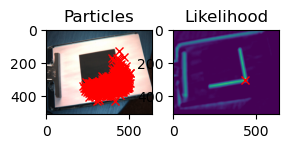

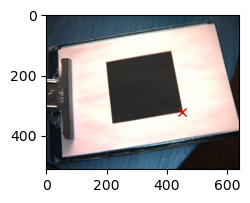

Processing Frame 83
(15,)
[451.78446844 316.87468627]


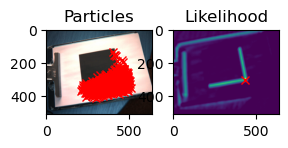

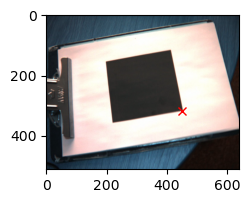

Processing Frame 84
(15,)
[450.35002746 312.85762138]


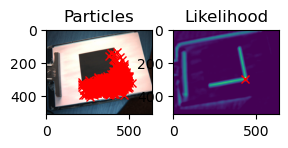

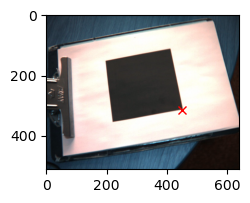

Processing Frame 85
(15,)
[450.55516968 309.54415849]


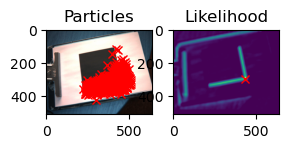

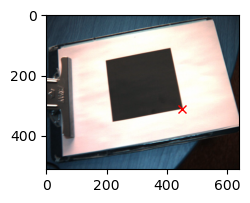

Processing Frame 86
(15,)
[447.46947536 310.03610149]


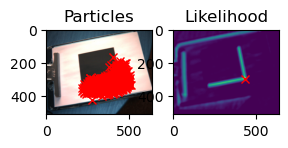

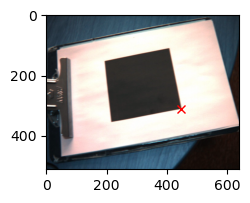

Processing Frame 87
(15,)
[444.47274446 308.0262251 ]


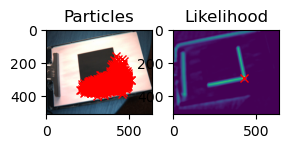

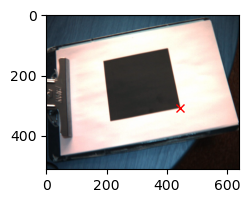

Processing Frame 88
(15,)
[439.86655721 303.44386991]


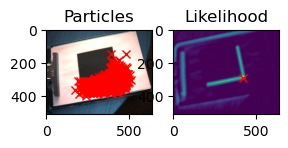

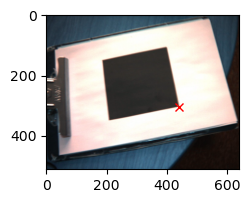

Processing Frame 89
(15,)
[435.43614024 300.95042467]


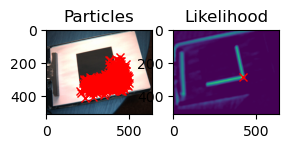

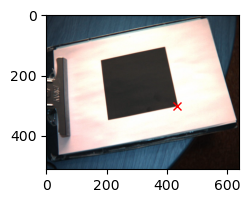

Processing Frame 90
(15,)
[433.83687735 297.71589361]


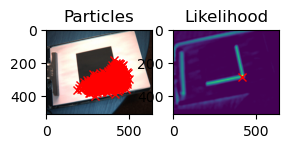

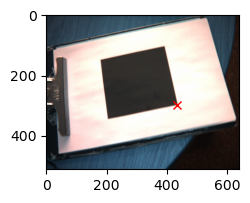

Processing Frame 91
(15,)
[433.68214945 296.18392328]


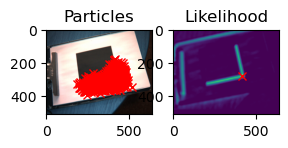

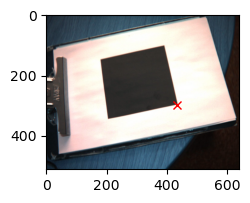

Processing Frame 92
(15,)
[433.99680354 292.51653419]


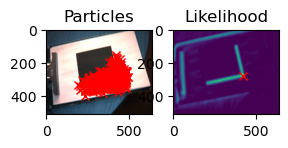

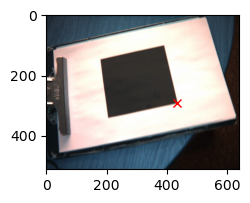

Processing Frame 93
(15,)
[435.47217581 287.76286239]


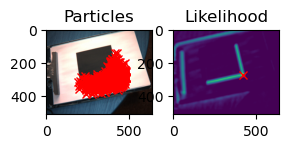

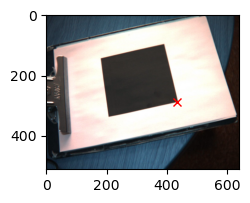

Processing Frame 94
(15,)
[434.59633218 284.89991001]


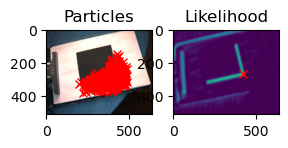

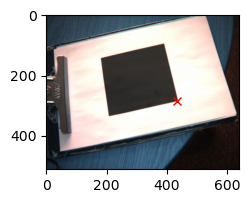

Processing Frame 95
(15,)
[435.03353821 282.30569916]


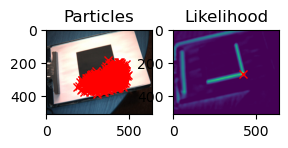

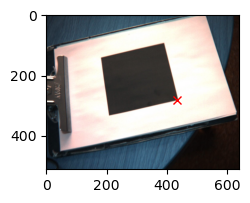

Processing Frame 96
(15,)
[430.45568128 286.51774535]


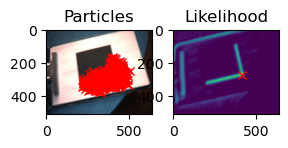

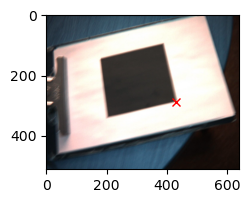

Processing Frame 97
(15,)
[416.18285156 296.1335999 ]


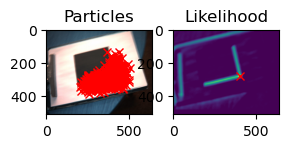

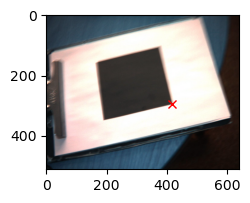

Processing Frame 98
(15,)
[410.34951785 298.39869859]


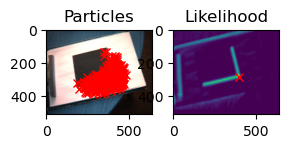

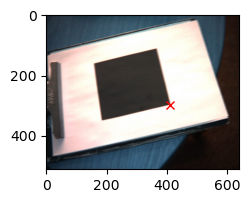

Processing Frame 99
(15,)
[403.58195947 304.68937081]


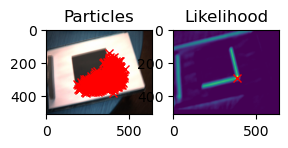

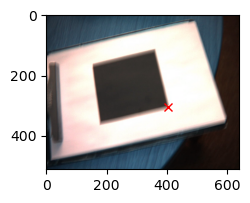

Processing Frame 100
(15,)
[396.5875419  313.97576465]


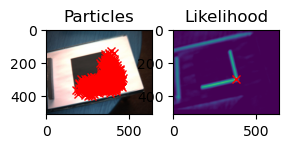

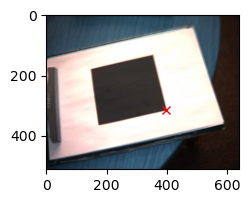

Processing Frame 101
(15,)
[394.11964992 316.15350092]


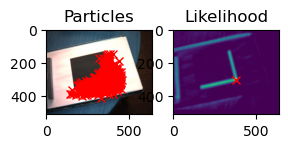

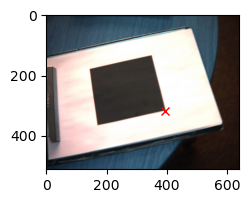

Processing Frame 102
(15,)
[388.00348722 315.82478018]


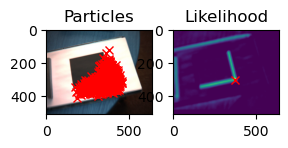

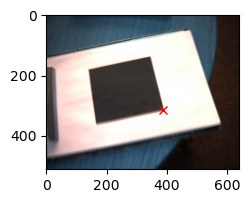

Processing Frame 103
(15,)
[390.30266186 308.21440879]


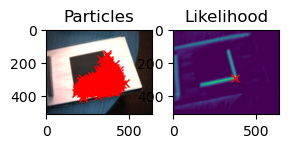

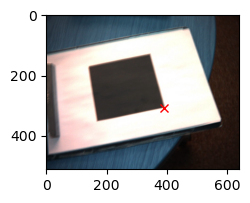

Processing Frame 104
(15,)
[389.88808676 303.22261824]


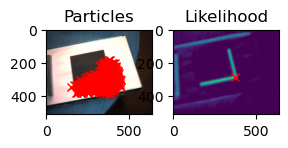

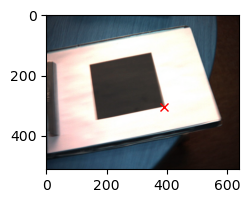

Processing Frame 105
(15,)
[381.43643771 299.17273649]


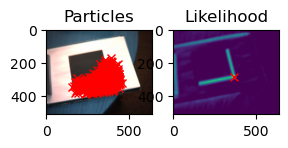

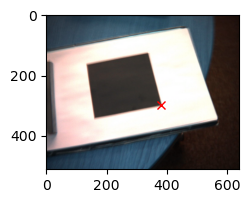

Processing Frame 106
(15,)
[386.8640623  296.23642885]


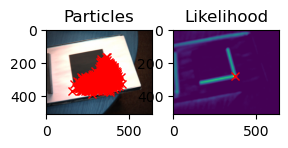

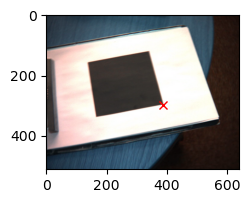

Processing Frame 107
(15,)
[387.29233764 292.01816161]


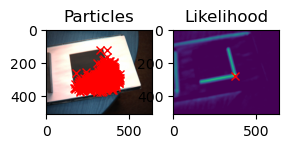

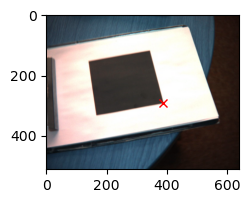

Processing Frame 108
(15,)
[383.63424726 292.99931955]


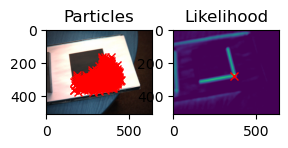

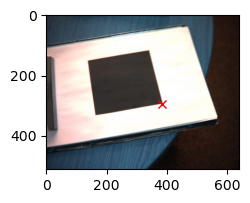

Processing Frame 109
(15,)
[382.21061989 292.87529733]


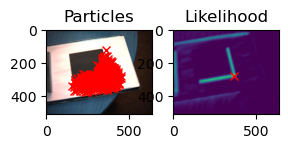

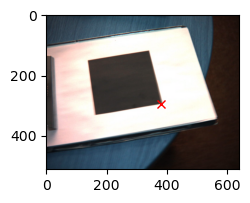

Processing Frame 110
(15,)
[372.48566128 298.42464584]


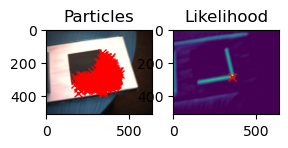

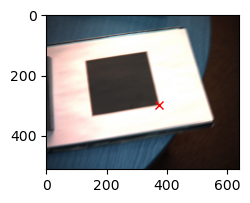

Processing Frame 111
(15,)
[366.49361062 311.17162593]


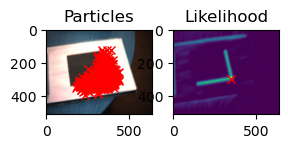

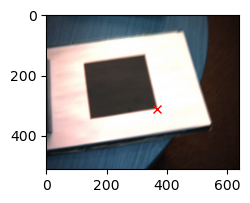

Processing Frame 112
(15,)
[360.93262154 317.1648071 ]


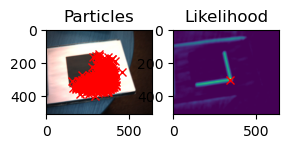

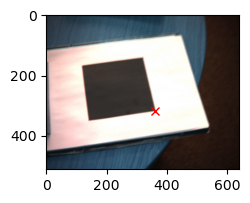

Processing Frame 113
(15,)
[358.34480675 320.53165929]


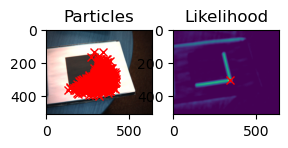

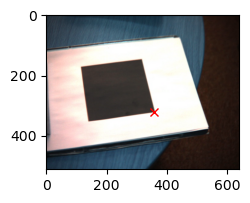

Processing Frame 114
(15,)
[361.22980243 326.00414253]


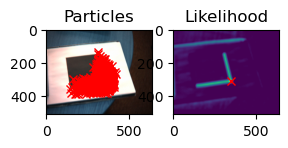

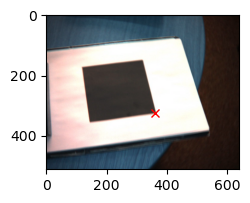

Processing Frame 115
(15,)
[363.93372466 329.01394119]


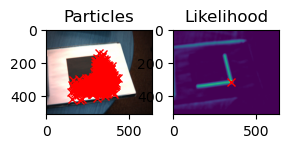

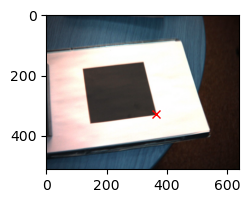

Processing Frame 116
(15,)
[369.36208263 331.69071331]


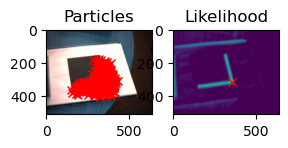

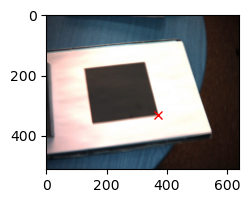

Processing Frame 117
(15,)
[373.86797265 337.6634159 ]


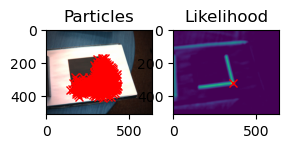

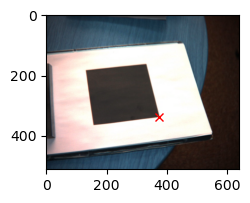

Processing Frame 118
(15,)
[377.91620352 336.08496684]


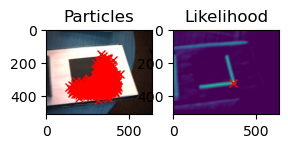

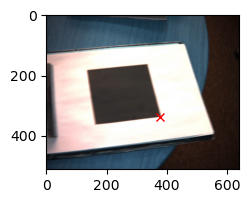

Processing Frame 119
(15,)
[388.44643643 336.314375  ]


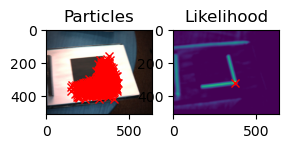

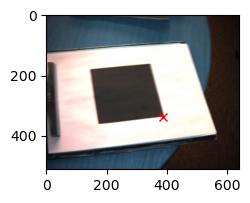

Processing Frame 120
(15,)
[393.00679108 339.85710996]


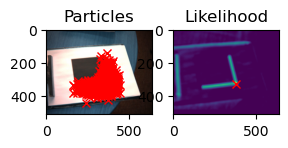

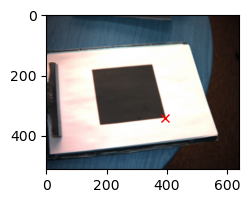

Processing Frame 121
(15,)
[397.95986428 338.12654326]


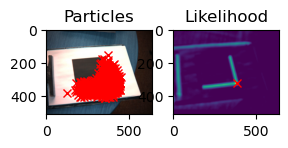

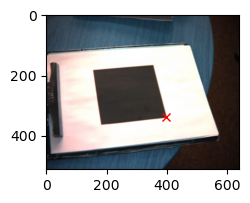

Processing Frame 122
(15,)
[401.18901192 334.8487528 ]


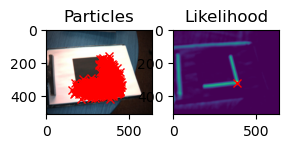

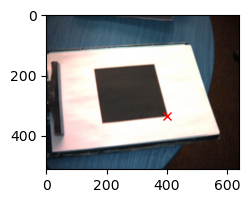

Processing Frame 123
(15,)
[402.83590763 331.54483089]


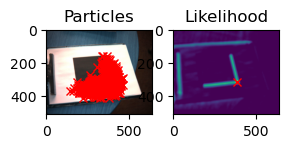

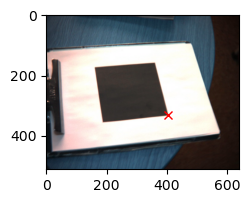

Processing Frame 124
(15,)
[397.37364331 338.37941263]


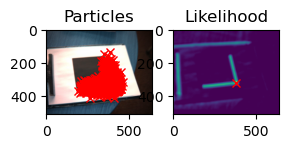

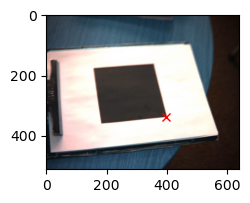

Processing Frame 125
(15,)
[397.61502761 335.7568713 ]


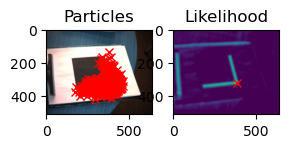

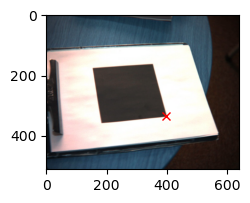

Processing Frame 126
(15,)
[403.2781544  333.28538273]


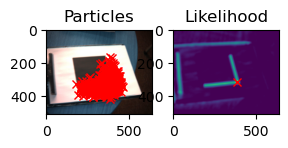

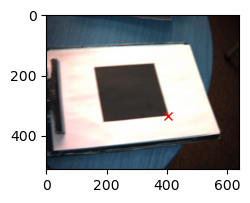

Processing Frame 127
(15,)
[410.03539775 331.5324449 ]


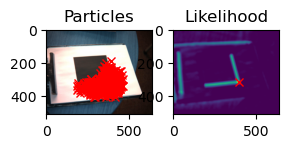

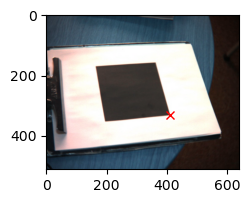

Processing Frame 128
(15,)
[410.6939673  335.13902817]


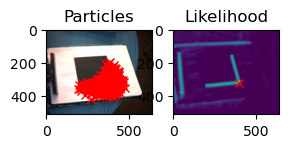

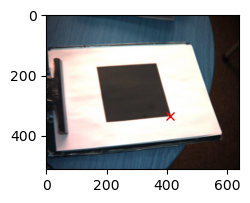

Processing Frame 129
(15,)
[413.08892235 336.17455609]


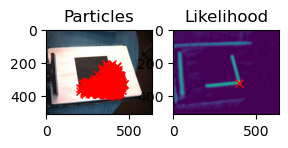

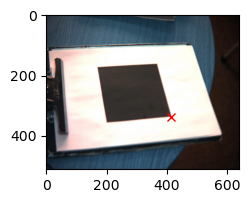

Processing Frame 130
(15,)
[405.97542955 341.75733052]


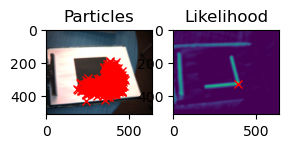

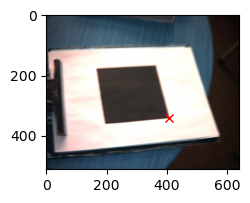

Processing Frame 131
(15,)
[395.71335672 338.42107408]


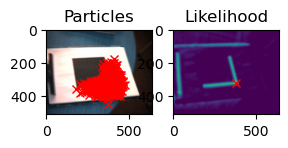

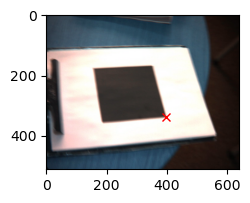

Processing Frame 132
(15,)
[390.64214629 327.41789077]


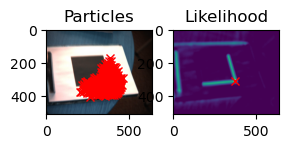

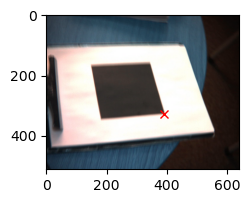

Processing Frame 133
(15,)
[390.47723656 320.06048851]


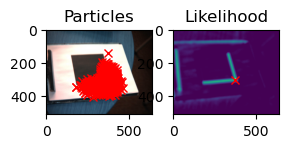

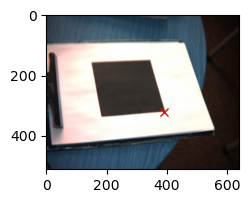

Processing Frame 134
(15,)
[388.87231339 314.15371141]


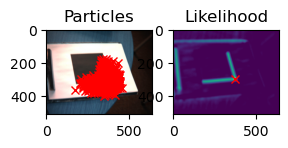

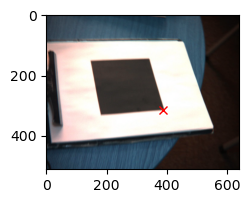

Processing Frame 135
(15,)
[390.68074143 308.26158408]


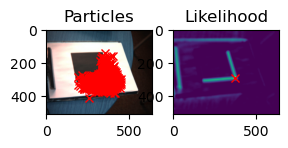

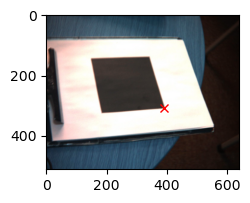

Processing Frame 136
(15,)
[393.21811331 304.17236679]


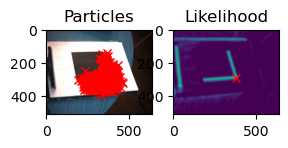

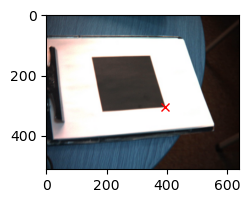

Processing Frame 137
(15,)
[392.08168793 300.86566249]


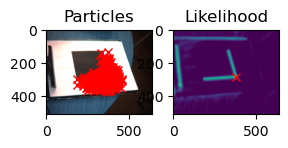

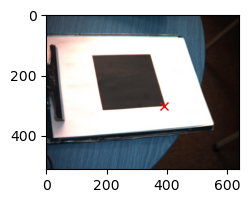

Processing Frame 138
(15,)
[393.16608013 298.84851918]


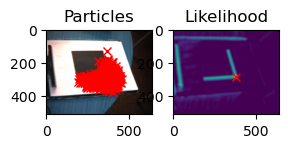

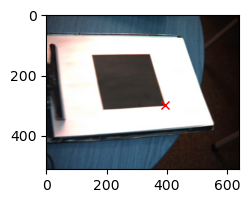

Processing Frame 139
(15,)
[396.79387338 296.48421558]


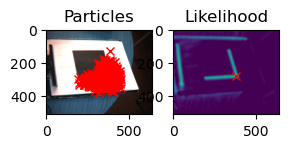

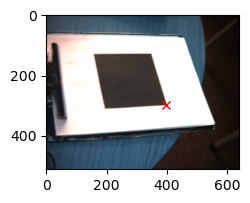

Processing Frame 140
(15,)
[400.48184407 297.38678508]


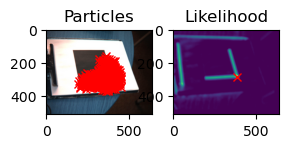

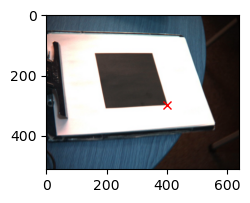

Processing Frame 141
(15,)
[396.51538862 301.90887023]


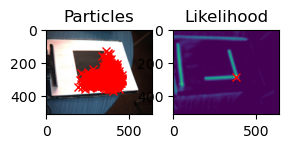

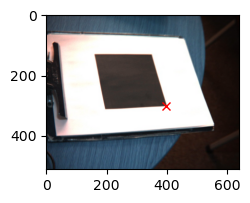

Processing Frame 142
(15,)
[394.9684137  297.12598167]


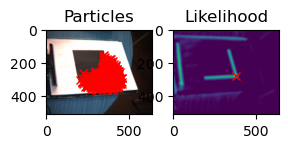

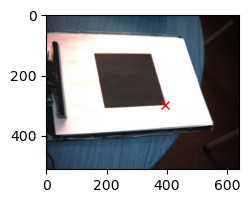

Processing Frame 143
(15,)
[388.89593388 298.15215742]


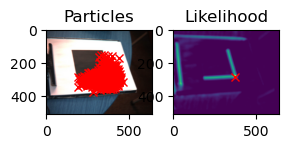

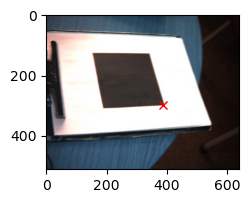

Processing Frame 144
(15,)
[382.15458882 303.32004856]


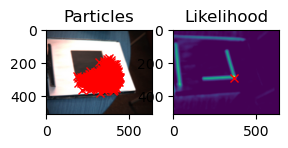

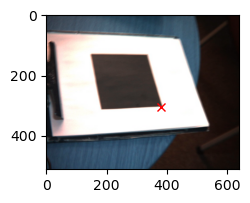

Processing Frame 145
(15,)
[378.47070237 291.84371743]


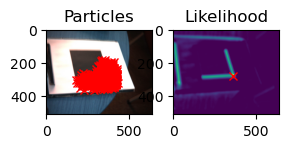

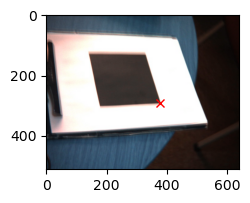

Processing Frame 146
(15,)
[371.07543886 292.60497424]


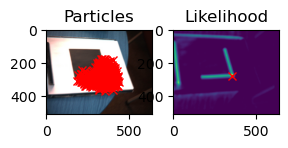

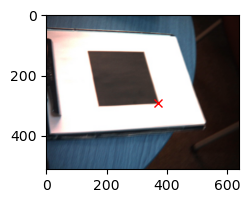

Processing Frame 147
(15,)
[363.07784796 301.184593  ]


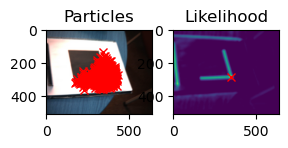

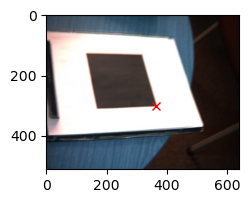

Processing Frame 148
(15,)
[358.63575226 304.44910743]


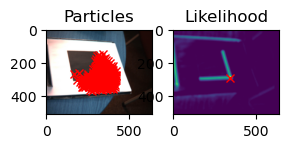

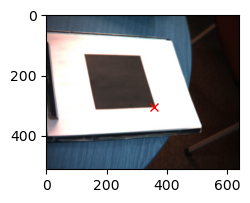

Processing Frame 149
(15,)
[361.79799943 305.55476112]


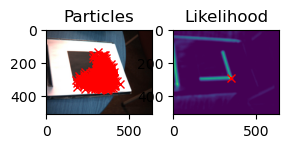

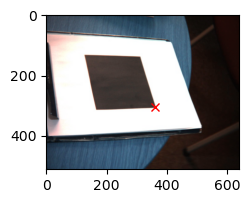

Processing Frame 150
(15,)
[358.63440899 306.22452753]


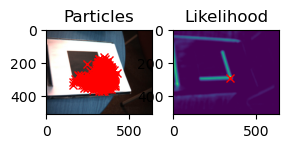

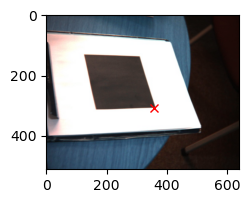

In [50]:
r = HW2_Practical7c('lr')